# YOLOv5 for Automatic License Plate Recognition, Trained and tested with custom Dataset

In [ ]:
!!pip install "numpy<1.24.0"

['Collecting numpy<1.24.0',
 '  Downloading numpy-1.23.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.3 kB)',
 'Downloading numpy-1.23.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.1 MB)',
 '\x1b[?25l   \x1b━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━\x1b \x1b0.0/17.1 MB\x1b \x1b?\x1b eta \x1b-:--:--\x1b',
 '\x1b[2K   \x1b━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━\x1b \x1b0.0/17.1 MB\x1b \x1b755.2 kB/s\x1b eta \x1b0:00:23\x1b',
 '\x1b[2K   \x1b━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━\x1b \x1b0.1/17.1 MB\x1b \x1b1.4 MB/s\x1b eta \x1b0:00:13\x1b',
 '\x1b[2K   \x1b╸\x1b\x1b━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━\x1b \x1b0.3/17.1 MB\x1b \x1b2.5 MB/s\x1b eta \x1b0:00:07\x1b',
 '\x1b[2K   \x1b━\x1b\x1b╸\x1b\x1b━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━\x1b \x1b0.6/17.1 MB\x1b \x1b4.6 MB/s\x1b eta \x1b0:00:04\x1b',
 '\x1b[2K   \x1b━━━\x1b\x1b╺\x1b\x1b━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━\x1b \x1b1.4/17.1 MB\x1b \x1b8.2 MB/s\x1b eta \x1b0:00:02\x1b',
 '\x1b[2K

In [ ]:
!git --version

git version 2.25.1


## Dataset Used for training - [Albanian Plates Dataset]

## Repro [YOLOv5](https://github.com/ultralytics/yolov5)

In [ ]:
# Clone YOLOv5 code
!git clone https://github.com/rkuo2000/yolov5
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 12560, done.
remote: Total 12560 (delta 0), reused 0 (delta 0), pack-reused 12560
Receiving objects: 100% (12560/12560), 12.43 MiB | 24.86 MiB/s, done.
Resolving deltas: 100% (8576/8576), done.
/kaggle/working/yolov5


In [ ]:
!echo "train: Dataset/train/images" > data/alpr.yaml
!echo "val:   Dataset/val/images" >> data/alpr.yaml

!echo "nc : 1" >> data/alpr.yaml
!echo "names: ['license']" >> data/alpr.yaml

!cat data/alpr.yaml

train: Dataset/train/images
val:   Dataset/val/images
nc : 1
names: ['license']


## Prepare Dataset

In [ ]:
import os
import numpy as np
from pathlib import Path
from xml.dom.minidom import parse
from shutil import copyfile

In [ ]:
FILE_ROOT = "/kaggle/input/targa-shqiptare"
IMAGE_PATH = FILE_ROOT + "images"
ANNOTATIONS_PATH = FILE_ROOT + "annotations"

DATA_ROOT = "Targa Shqiptare/"
DEST_IMAGES_PATH = "train/images"
DEST_LABELS_PATH = "train/labels"

In [ ]:
!mkdir -p Dataset/train/labels

In [ ]:
# copy images
!mkdir -p Dataset/train
!cp -rf /kaggle/input/targa-shqiptare/Targa\ Shqiptare/images Dataset/train

In [ ]:
!mkdir -p Dataset/val
!cp -rf /kaggle/input/validationlpr-albanian/valDataset/images Dataset/val

### Convert COCO Annotations to YOLOv5 Labels

In [ ]:
import os
import numpy as np
from xml.dom.minidom import parse

ANN = '/kaggle/input/targa-shqiptare/Targa Shqiptare/annotations'
DEST_LABELS_PATH = '/kaggle/working/yolov5/Dataset/train/labels'
DATA_ROOT = '/kaggle/working/yolov5/Dataset/train'

def ensure_directory_exists(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

def cord_converter(size, box):
    """
    convert xml annotation to darknet format coordinates
    :param size： [w,h]
    :param box: anchor box coordinates [upper-left x,uppler-left y,lower-right x, lower-right y]
    :return: converted [x,y,w,h]
    """
    x1 = int(box[0])
    y1 = int(box[1])
    x2 = int(box[2])
    y2 = int(box[3])

    dw = np.float32(1. / int(size[0]))
    dh = np.float32(1. / int(size[1]))

    w = x2 - x1
    h = y2 - y1
    x = x1 + (w / 2)
    y = y1 + (h / 2)

    x = x * dw
    w = w * dw
    y = y * dh
    h = h * dh
    return [x, y, w, h]

def save_file(img_jpg_file_name, size, img_box):
    classes = ['license']
    save_file_name = os.path.join(DEST_LABELS_PATH, img_jpg_file_name + '.txt')
    print(save_file_name)

    # Ensure the directory exists
    ensure_directory_exists(DEST_LABELS_PATH)

    with open(save_file_name, "a+") as file_path:
        for box in img_box:
            cls_num = 0
            new_box = cord_converter(size, box[1:])  # convert box coord into YOLO x,y,w,h
            file_path.write(f"{cls_num} {new_box[0]} {new_box[1]} {new_box[2]} {new_box[3]}\n")

def get_xml_data(file_path, img_xml_file):
    img_path = os.path.join(file_path, img_xml_file + '.xml')
    print(img_path)

    dom = parse(img_path)
    root = dom.documentElement
    img_name = root.getElementsByTagName("filename")[0].childNodes[0].data
    img_size = root.getElementsByTagName("size")[0]
    objects = root.getElementsByTagName("object")
    img_w = img_size.getElementsByTagName("width")[0].childNodes[0].data
    img_h = img_size.getElementsByTagName("height")[0].childNodes[0].data
    img_c = img_size.getElementsByTagName("depth")[0].childNodes[0].data

    img_box = []
    for box in objects:
        cls_name = box.getElementsByTagName("name")[0].childNodes[0].data
        x1 = int(box.getElementsByTagName("xmin")[0].childNodes[0].data)
        y1 = int(box.getElementsByTagName("ymin")[0].childNodes[0].data)
        x2 = int(box.getElementsByTagName("xmax")[0].childNodes[0].data)
        y2 = int(box.getElementsByTagName("ymax")[0].childNodes[0].data)
        print("box:(c,xmin,ymin,xmax,ymax)", cls_name, x1, y1, x2, y2)
        img_jpg_file_name = img_xml_file + '.jpg'
        img_box.append([cls_name, x1, y1, x2, y2])

    save_file(img_xml_file, [img_w, img_h], img_box)

# Process all XML files in the directory
files = os.listdir(ANN)
for file in files:
    print("file name: ", file)
    file_xml = file.split(".")
    get_xml_data(ANN, file_xml[0])


file name:  142.xml
/kaggle/input/targa-shqiptare/Targa Shqiptare/annotations/142.xml
box:(c,xmin,ymin,xmax,ymax) licence 476 740 817 834
/kaggle/working/yolov5/Dataset/train/labels/142.txt
file name:  84.xml
/kaggle/input/targa-shqiptare/Targa Shqiptare/annotations/84.xml
box:(c,xmin,ymin,xmax,ymax) licence 114 1043 632 1226
/kaggle/working/yolov5/Dataset/train/labels/84.txt
file name:  254.xml
/kaggle/input/targa-shqiptare/Targa Shqiptare/annotations/254.xml
box:(c,xmin,ymin,xmax,ymax) licence 900 1237 1281 1376
/kaggle/working/yolov5/Dataset/train/labels/254.txt
file name:  110.xml
/kaggle/input/targa-shqiptare/Targa Shqiptare/annotations/110.xml
box:(c,xmin,ymin,xmax,ymax) licence 546 1127 994 1376
/kaggle/working/yolov5/Dataset/train/labels/110.txt
file name:  166.xml
/kaggle/input/targa-shqiptare/Targa Shqiptare/annotations/166.xml
box:(c,xmin,ymin,xmax,ymax) licence 944 1008 1798 1332
/kaggle/working/yolov5/Dataset/train/labels/166.txt
file name:  120.xml
/kaggle/input/targa-shq

In [ ]:
import os
import numpy as np
from xml.dom.minidom import parse

ANN = '/kaggle/input/validationlpr-albanian/valDataset/annotations'
DEST_LABELS_PATH = '/kaggle/working/yolov5/Dataset/val/labels'
DATA_ROOT = '/kaggle/working/yolov5/Dataset/val'

def ensure_directory_exists(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

def cord_converter(size, box):
    """
    convert xml annotation to darknet format coordinates
    :param size： [w,h]
    :param box: anchor box coordinates [upper-left x,uppler-left y,lower-right x, lower-right y]
    :return: converted [x,y,w,h]
    """
    x1 = int(box[0])
    y1 = int(box[1])
    x2 = int(box[2])
    y2 = int(box[3])

    dw = np.float32(1. / int(size[0]))
    dh = np.float32(1. / int(size[1]))

    w = x2 - x1
    h = y2 - y1
    x = x1 + (w / 2)
    y = y1 + (h / 2)

    x = x * dw
    w = w * dw
    y = y * dh
    h = h * dh
    return [x, y, w, h]

def save_file(img_jpg_file_name, size, img_box):
    classes = ['license']
    save_file_name = os.path.join(DEST_LABELS_PATH, img_jpg_file_name + '.txt')
    print(save_file_name)

    # Ensure the directory exists
    ensure_directory_exists(DEST_LABELS_PATH)

    with open(save_file_name, "a+") as file_path:
        for box in img_box:
            cls_num = 0
            new_box = cord_converter(size, box[1:])  # convert box coord into YOLO x,y,w,h
            file_path.write(f"{cls_num} {new_box[0]} {new_box[1]} {new_box[2]} {new_box[3]}\n")

def get_xml_data(file_path, img_xml_file):
    img_path = os.path.join(file_path, img_xml_file + '.xml')
    print(img_path)

    dom = parse(img_path)
    root = dom.documentElement
    img_name = root.getElementsByTagName("filename")[0].childNodes[0].data
    img_size = root.getElementsByTagName("size")[0]
    objects = root.getElementsByTagName("object")
    img_w = img_size.getElementsByTagName("width")[0].childNodes[0].data
    img_h = img_size.getElementsByTagName("height")[0].childNodes[0].data
    img_c = img_size.getElementsByTagName("depth")[0].childNodes[0].data

    img_box = []
    for box in objects:
        cls_name = box.getElementsByTagName("name")[0].childNodes[0].data
        x1 = int(box.getElementsByTagName("xmin")[0].childNodes[0].data)
        y1 = int(box.getElementsByTagName("ymin")[0].childNodes[0].data)
        x2 = int(box.getElementsByTagName("xmax")[0].childNodes[0].data)
        y2 = int(box.getElementsByTagName("ymax")[0].childNodes[0].data)
        print("box:(c,xmin,ymin,xmax,ymax)", cls_name, x1, y1, x2, y2)
        img_jpg_file_name = img_xml_file + '.jpg'
        img_box.append([cls_name, x1, y1, x2, y2])

    save_file(img_xml_file, [img_w, img_h], img_box)

# Process all XML files in the directory
files = os.listdir(ANN)
for file in files:
    print("file name: ", file)
    file_xml = file.split(".")
    get_xml_data(ANN, file_xml[0])


file name:  page_18.xml
/kaggle/input/validationlpr-albanian/valDataset/annotations/page_18.xml
box:(c,xmin,ymin,xmax,ymax) licence 699 789 1371 1059
/kaggle/working/yolov5/Dataset/val/labels/page_18.txt
file name:  page_15.xml
/kaggle/input/validationlpr-albanian/valDataset/annotations/page_15.xml
box:(c,xmin,ymin,xmax,ymax) licence 663 888 871 974
/kaggle/working/yolov5/Dataset/val/labels/page_15.txt
file name:  page_21.xml
/kaggle/input/validationlpr-albanian/valDataset/annotations/page_21.xml
box:(c,xmin,ymin,xmax,ymax) licence 469 679 1336 931
/kaggle/working/yolov5/Dataset/val/labels/page_21.txt
file name:  page_9.xml
/kaggle/input/validationlpr-albanian/valDataset/annotations/page_9.xml
box:(c,xmin,ymin,xmax,ymax) licence 186 773 569 891
/kaggle/working/yolov5/Dataset/val/labels/page_9.txt
file name:  page_22.xml
/kaggle/input/validationlpr-albanian/valDataset/annotations/page_22.xml
box:(c,xmin,ymin,xmax,ymax) licence 819 785 1311 956
/kaggle/working/yolov5/Dataset/val/labels/p

In [ ]:
!ls Dataset/train/labels

1.txt	 121.txt  151.txt  181.txt  207.txt  231.txt  27.txt   50.txt  79.txt
10.txt	 122.txt  152.txt  182.txt  209.txt  232.txt  28.txt   51.txt  8.txt
100.txt  123.txt  153.txt  183.txt  21.txt   233.txt  29.txt   52.txt  80.txt
101.txt  124.txt  154.txt  184.txt  210.txt  234.txt  300.txt  53.txt  82.txt
102.txt  125.txt  155.txt  185.txt  211.txt  235.txt  302.txt  54.txt  83.txt
103.txt  126.txt  156.txt  187.txt  212.txt  236.txt  32.txt   55.txt  84.txt
104.txt  129.txt  157.txt  188.txt  213.txt  237.txt  33.txt   57.txt  85.txt
105.txt  13.txt   158.txt  189.txt  214.txt  238.txt  34.txt   58.txt  86.txt
106.txt  130.txt  16.txt   19.txt   215.txt  239.txt  35.txt   59.txt  87.txt
107.txt  131.txt  160.txt  191.txt  216.txt  24.txt   36.txt   6.txt   88.txt
108.txt  132.txt  161.txt  192.txt  217.txt  240.txt  37.txt   60.txt  89.txt
109.txt  133.txt  163.txt  193.txt  218.txt  241.txt  38.txt   61.txt  9.txt
11.txt	 134.txt  166.txt  194.txt  219.txt  242.txt  39.txt   63.txt 

In [ ]:
!ls Dataset/val/labels

page_1.txt   page_15.txt  page_20.txt  page_26.txt  page_31.txt  page_8.txt
page_10.txt  page_16.txt  page_21.txt  page_27.txt  page_32.txt  page_9.txt
page_11.txt  page_17.txt  page_22.txt  page_28.txt  page_4.txt
page_12.txt  page_18.txt  page_23.txt  page_29.txt  page_5.txt
page_13.txt  page_19.txt  page_24.txt  page_3.txt   page_6.txt
page_14.txt  page_2.txt   page_25.txt  page_30.txt  page_7.txt


In [ ]:
!ls Dataset/train/images

1.png	 121.png  151.png  181.png  207.png  231.png  27.png   50.png  79.png
10.png	 122.png  152.png  182.png  209.png  232.png  28.png   51.png  8.png
100.png  123.png  153.png  183.png  21.png   233.png  29.png   52.png  80.png
101.png  124.png  154.png  184.png  210.png  234.png  300.png  53.png  82.png
102.png  125.png  155.png  185.png  211.png  235.png  302.png  54.png  83.png
103.png  126.png  156.png  187.png  212.png  236.png  32.png   55.png  84.png
104.png  129.png  157.png  188.png  213.png  237.png  33.png   57.png  85.png
105.png  13.png   158.png  189.png  214.png  238.png  34.png   58.png  86.png
106.png  130.png  16.png   19.png   215.png  239.png  35.png   59.png  87.png
107.png  131.png  160.png  191.png  216.png  24.png   36.png   6.png   88.png
108.png  132.png  161.png  192.png  217.png  240.png  37.png   60.png  89.png
109.png  133.png  163.png  193.png  218.png  241.png  38.png   61.png  9.png
11.png	 134.png  166.png  194.png  219.png  242.png  39.png   63.png 

In [ ]:
!ls Dataset/val/images

page_1.png   page_15.png  page_20.png  page_26.png  page_31.png  page_8.png
page_10.png  page_16.png  page_21.png  page_27.png  page_32.png  page_9.png
page_11.png  page_17.png  page_22.png  page_28.png  page_4.png
page_12.png  page_18.png  page_23.png  page_29.png  page_5.png
page_13.png  page_19.png  page_24.png  page_3.png   page_6.png
page_14.png  page_2.png   page_25.png  page_30.png  page_7.png


## YOLOv5 Training

In [ ]:
import os

os.environ["WANDB_MODE"] = "dryrun"

In [ ]:
!python train.py --img 416 --batch 16 --epochs 50 --data data/alpr.yaml --cfg models/yolov5s.yaml

2024-05-23 19:57:27.681511: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-23 19:57:27.681651: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-23 19:57:27.961846: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=data/alpr.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, 

## YOLOv5 Detect

In [ ]:
%cd yolov5

[Errno 2] No such file or directory: 'yolov5'
/kaggle/working/yolov5


In [ ]:
!python detect.py --source /kaggle/working/yolov5/Dataset/val/images --conf 0.4 --weights runs/train/exp/weights/best.pt --save-txt

detect: weights=['runs/train/exp/weights/best.pt'], source=/kaggle/working/yolov5/Dataset/val/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-303-gb3ca8d8 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients
image 1/32 /kaggle/working/yolov5/Dataset/val/images/page_1.png: 640x640 2 licenses, Done. (0.012s)
image 2/32 /kaggle/working/yolov5/Dataset/val/images/page_10.png: 640x640 2 licenses, Done. (0.012s)
image 3/32 /kaggle/working/yolov5/Dataset/val/images/page_11.png: 640x640 1 license, Done. (0.012s)
image 4/32 /kaggle/working/yolov5/Dataset/val/images/pag

### Displaying some Detected Images

In [ ]:
from IPython.display import Image

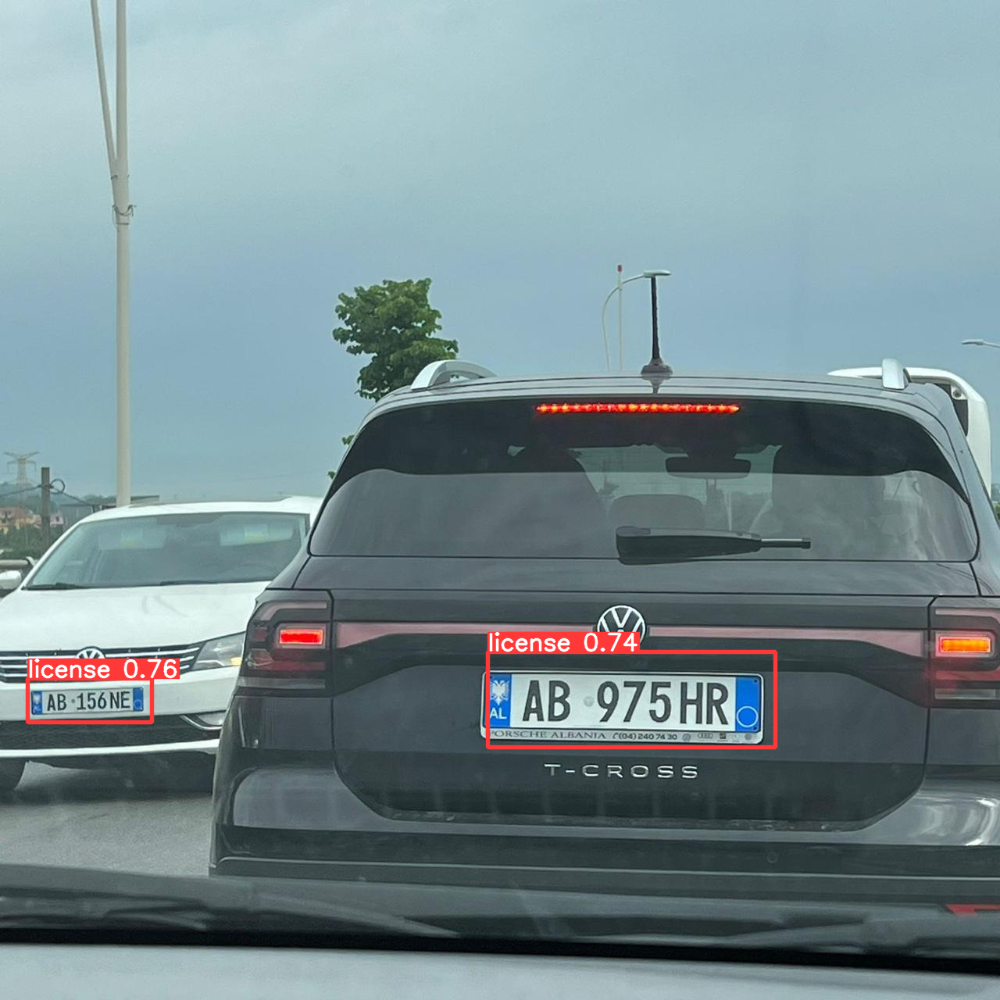

In [ ]:
Image('/kaggle/working/yolov5/runs/detect/exp/page_1.png')

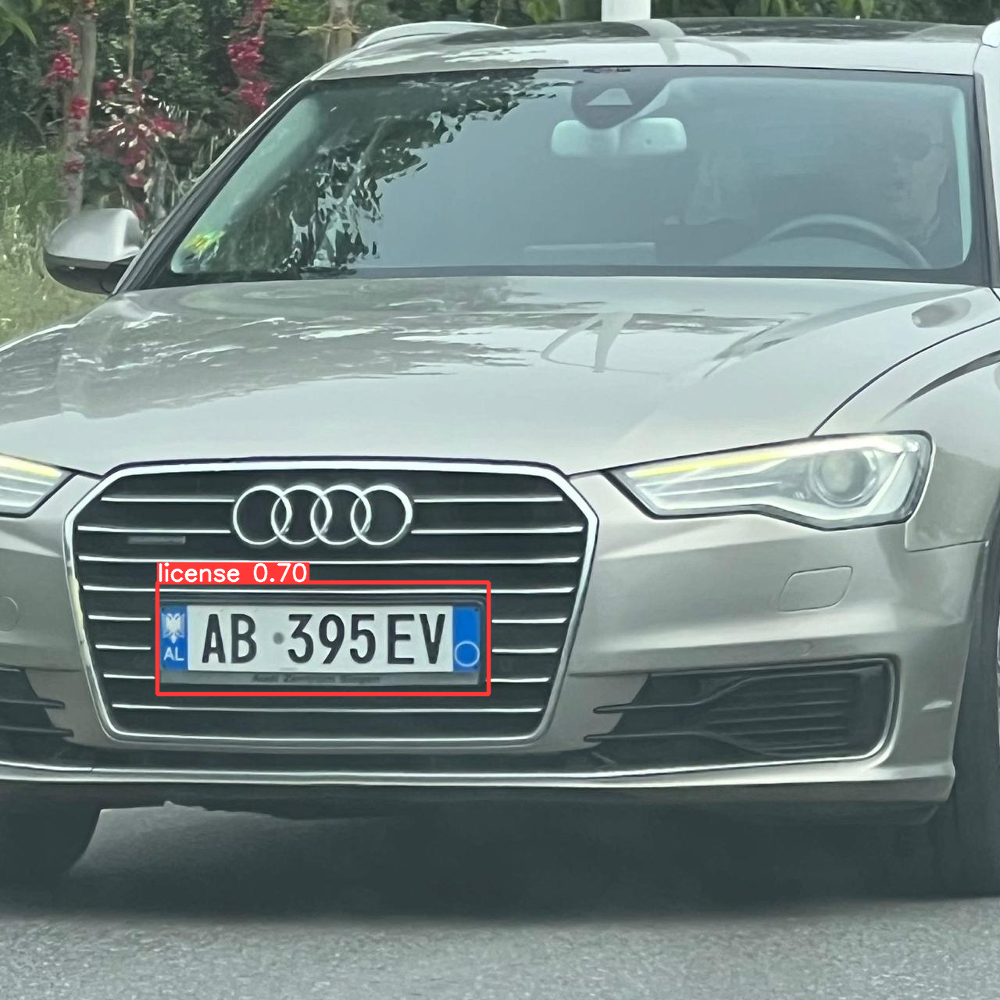

In [ ]:
Image('/kaggle/working/yolov5/runs/detect/exp/page_11.png')

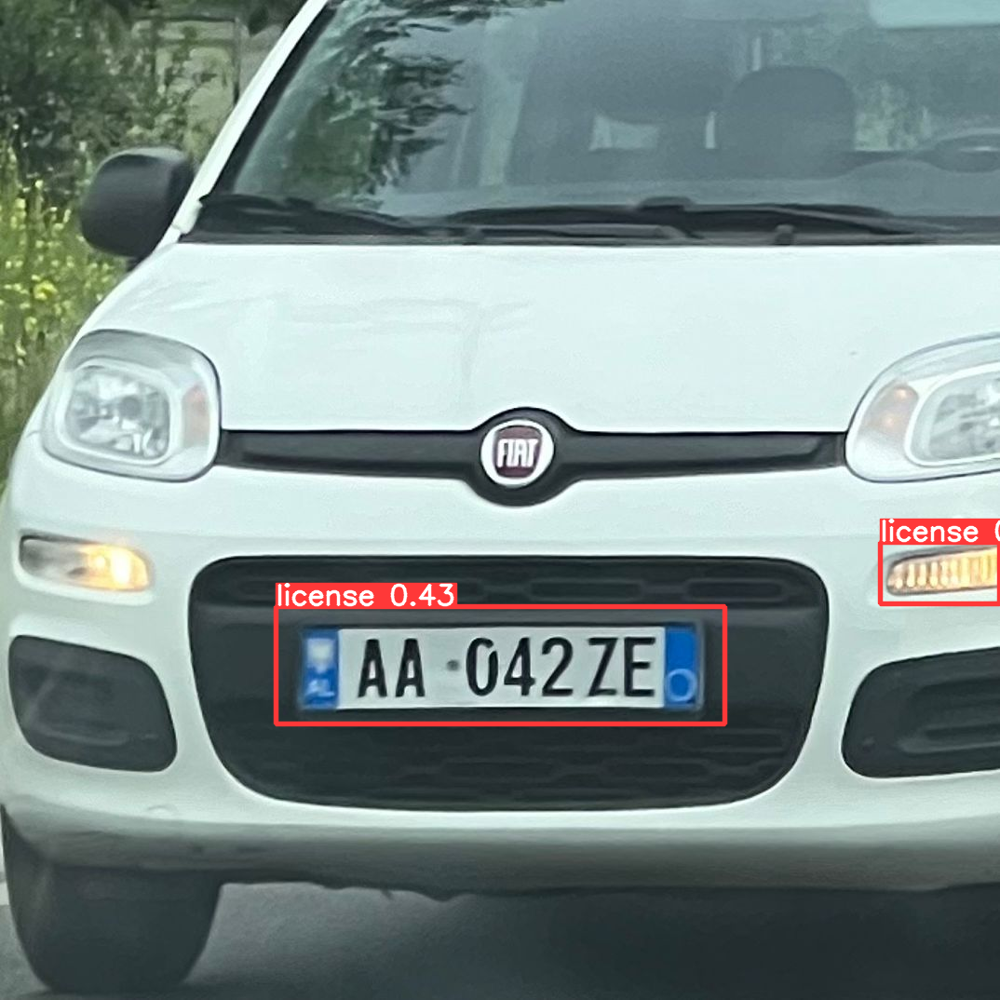

In [ ]:
Image('/kaggle/working/yolov5/runs/detect/exp/page_10.png')

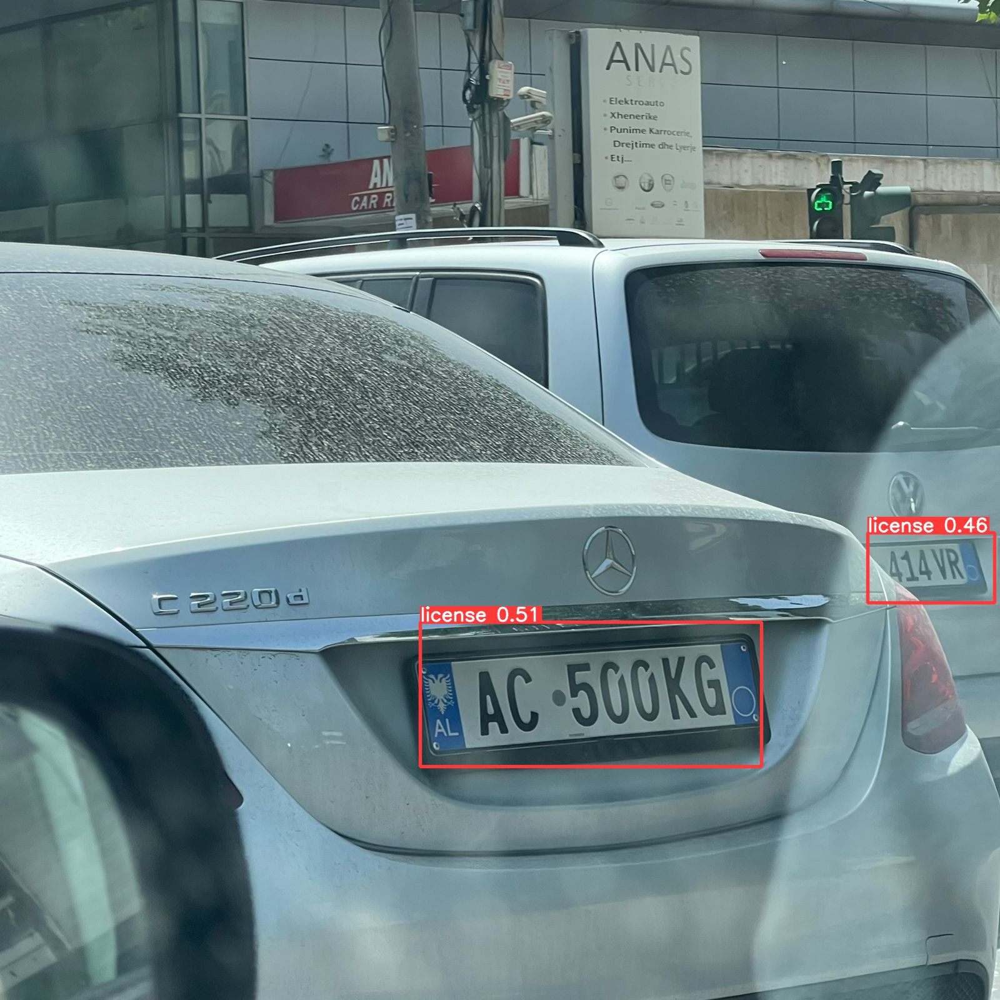

In [ ]:
Image('/kaggle/working/yolov5/runs/detect/exp/page_7.png')

# Crop and save each detected plate in a folder 'cropped_images'

After detecting the plates in the validation set, I crop each plate out of the box to perform recognition.

In [ ]:
import os
from pathlib import Path
from PIL import Image

def read_labels(labels_path):
    """ Read labels from a specified path and return a dictionary of image names with their bounding boxes. """
    labels = {}
    for label_file in os.listdir(labels_path):
        if label_file.endswith(".txt"):
            with open(os.path.join(labels_path, label_file), 'r') as file:
                lines = file.readlines()
                if len(lines) == 1:  # Check if there is exactly one detection
                    image_name = label_file.replace('.txt', '.png')
                    labels[image_name] = [list(map(float, line.split()[1:])) for line in lines]
    return labels

def crop_and_save_images(images_path, labels, save_path):
    """ Crop images based on bounding boxes and save the cropped images to a specified path. """
    for image_name, bboxes in labels.items():
        image_path = os.path.join(images_path, image_name)
        image = Image.open(image_path)
        for bbox in bboxes:
            x_center, y_center, width, height = bbox
            img_width, img_height = image.size
            left = int((x_center - width / 2) * img_width)
            right = int((x_center + width / 2) * img_width)
            top = int((y_center - height / 2) * img_height)
            bottom = int((y_center + height / 2) * img_height)
            cropped_image = image.crop((left, top, right, bottom))
            cropped_image_save_path = os.path.join(save_path, image_name)
            cropped_image.save(cropped_image_save_path)

def main():
    labels_path = "runs/detect/exp/labels"
    images_path = "/kaggle/working/yolov5/Dataset/val/images"
    save_path = "cropped_images"
    Path(save_path).mkdir(parents=True, exist_ok=True)

    labels = read_labels(labels_path)
    crop_and_save_images(images_path, labels, save_path)

if __name__ == "__main__":
    main()


In [ ]:
!ls /kaggle/working/yolov5/cropped_images

page_11.png  page_16.png  page_22.png  page_26.png  page_31.png  page_8.png
page_12.png  page_18.png  page_23.png  page_27.png  page_32.png  page_9.png
page_13.png  page_2.png   page_24.png  page_28.png  page_4.png
page_15.png  page_20.png  page_25.png  page_29.png  page_6.png


## OCR

### get detected ALPR bounding box

## Another try using EasyOCR

In [ ]:
from IPython.display import clear_output
!pip install keras-ocr
clear_output()

In [ ]:
import pytesseract
import keras_ocr
import easyocr
import matplotlib.pyplot as plt
import cv2
%matplotlib inline

2024-05-23 20:47:24.207244: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-23 20:47:24.207310: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-23 20:47:24.208894: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
!ls /kaggle/input/labeledtrain

06876DE.png  AA536GS.png  AB042BC.png  AB395EV.png  AB863IK.png  AC500KG.png
AA042ZE.png  AA706AE.png  AB132MZ.png  AB462NP.png  AB906NN.png  AH293T.png
AA124RH.png  AA759NY.png  AB334HU.png  AB489MN.png  AB916HS.png  DDIOBER.png
AA284NV.png  AA906RY.png  AB347JM.png  AB591FR.png  AB975HR.png
AA414VR.png  AB022HA.png  AB391KY.png  AB837DB.png  AC100OD.png


# Preprocess the cropped photos

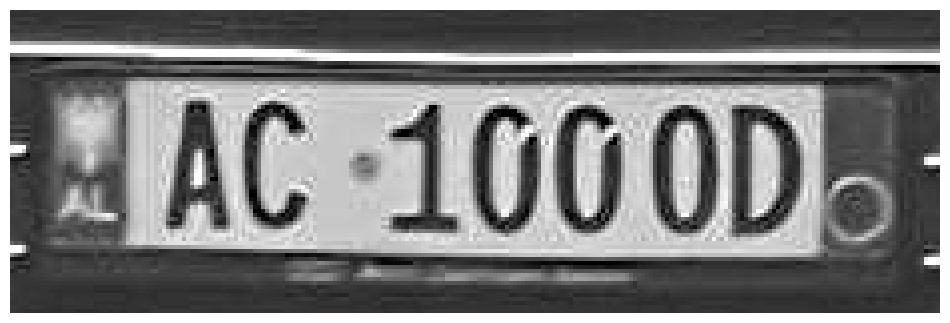

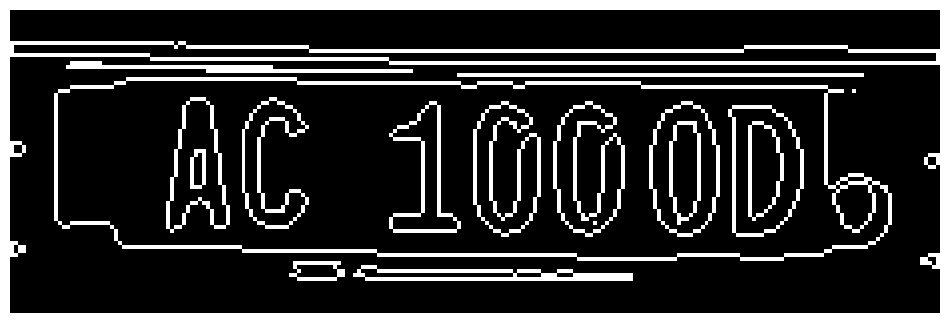

Processed and saved page_13.png


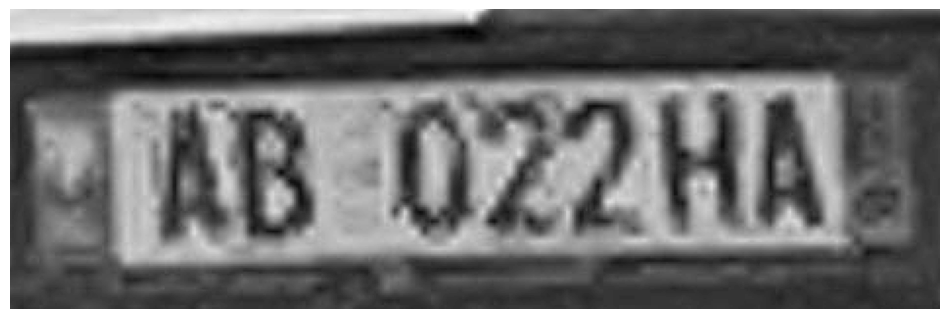

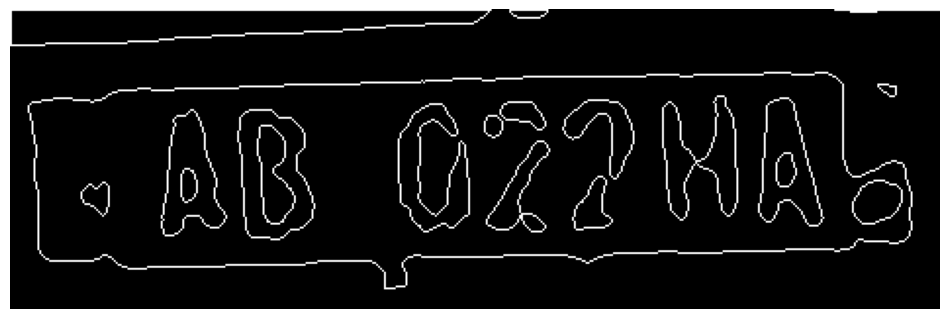

Processed and saved page_27.png


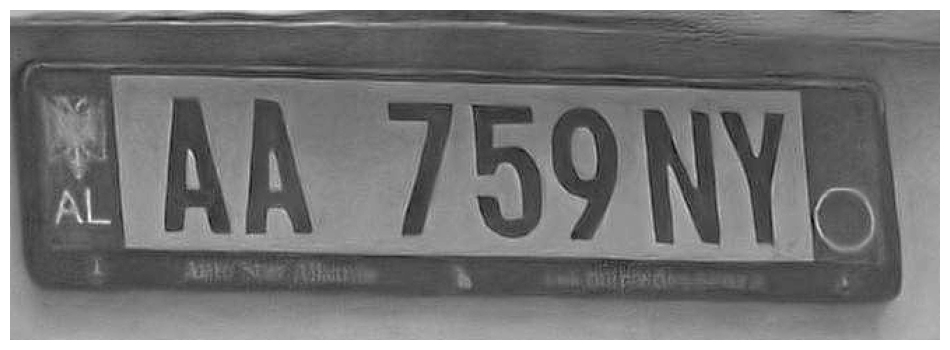

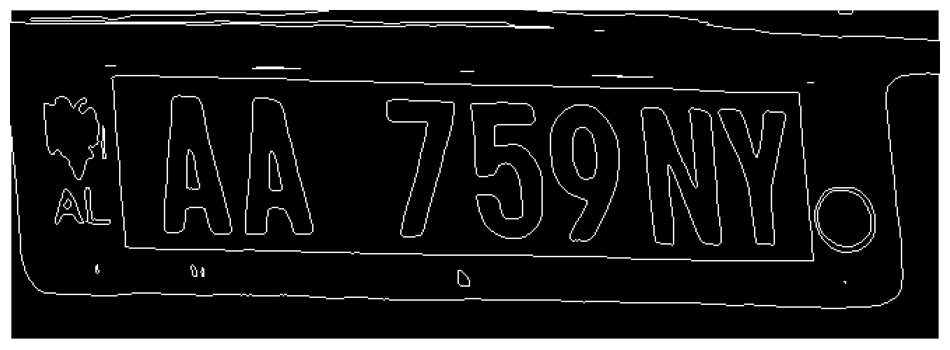

Processed and saved page_18.png


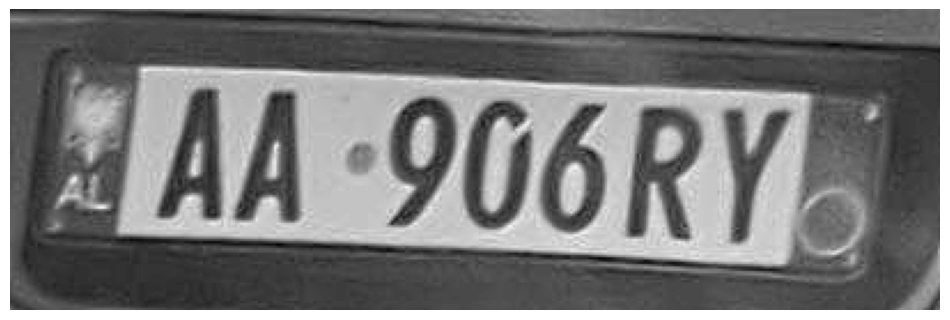

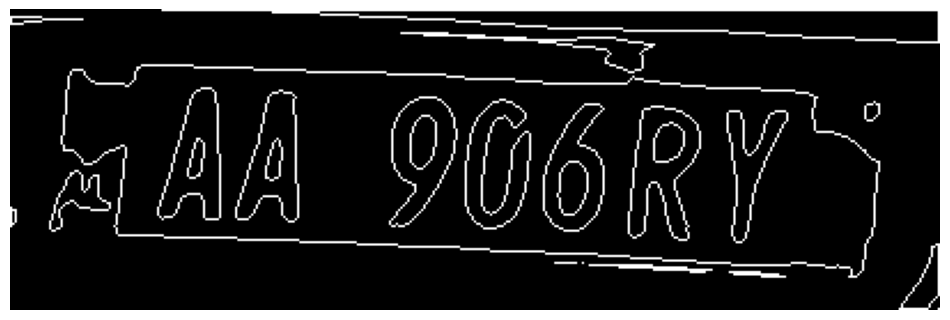

Processed and saved page_26.png


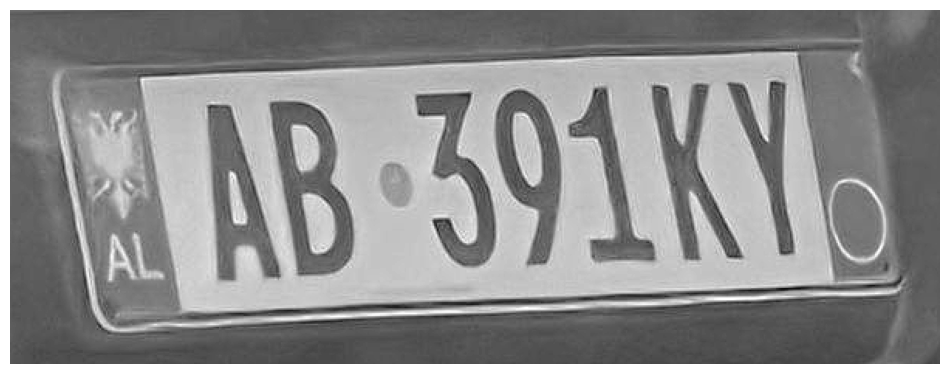

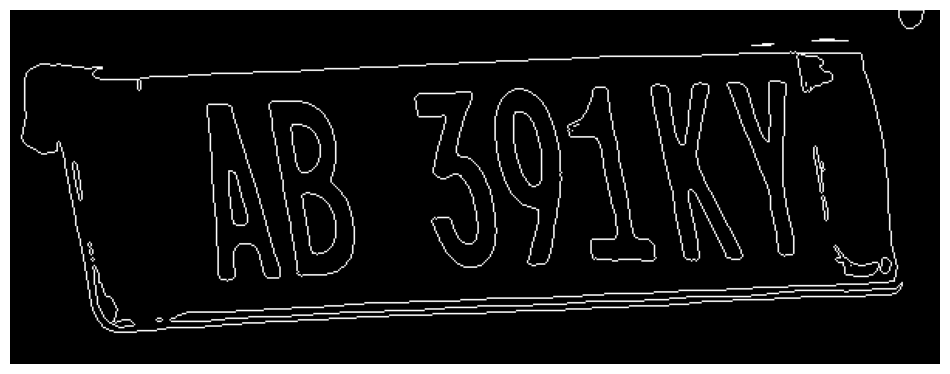

Processed and saved page_6.png


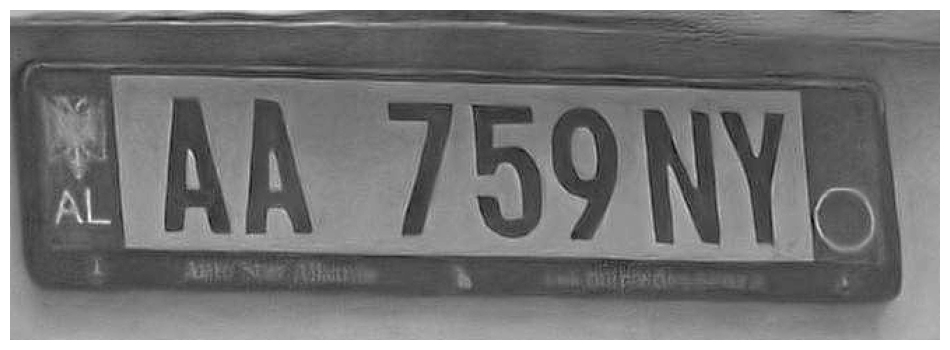

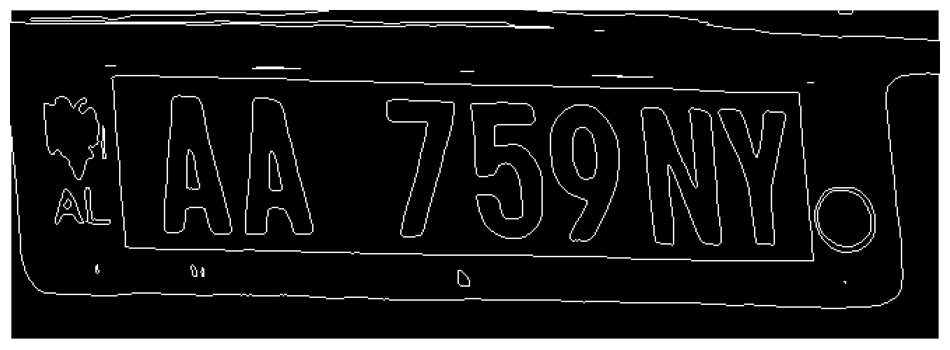

Processed and saved page_20.png


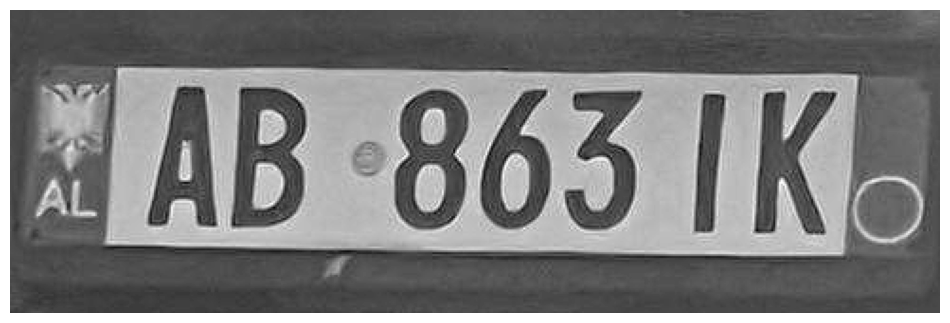

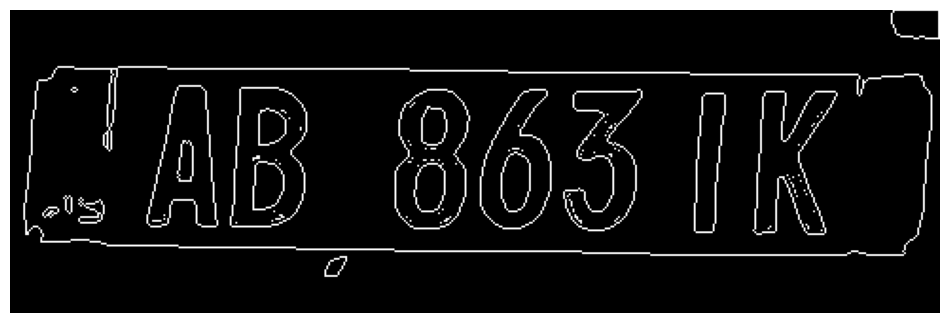

Processed and saved page_29.png


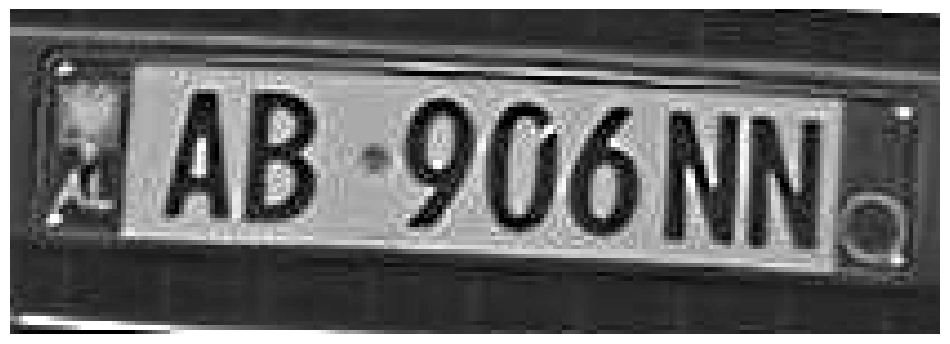

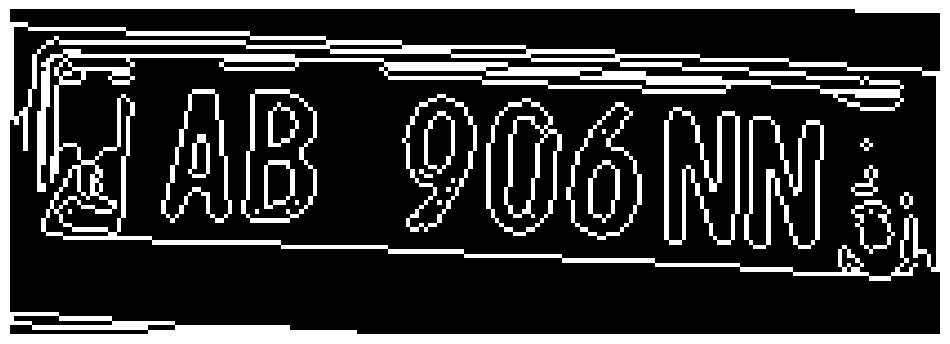

Processed and saved page_15.png


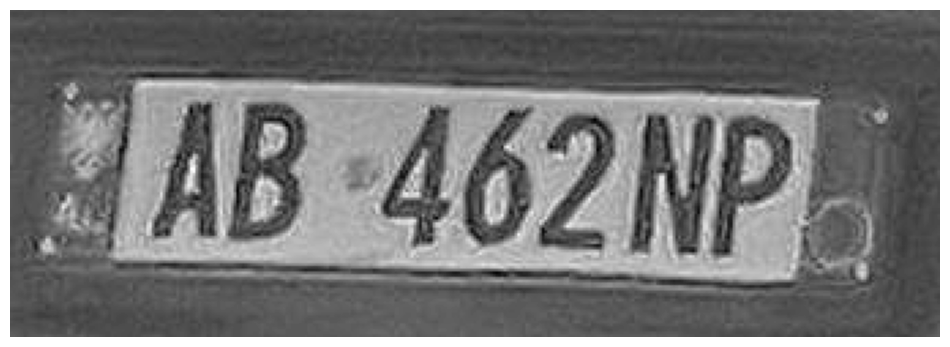

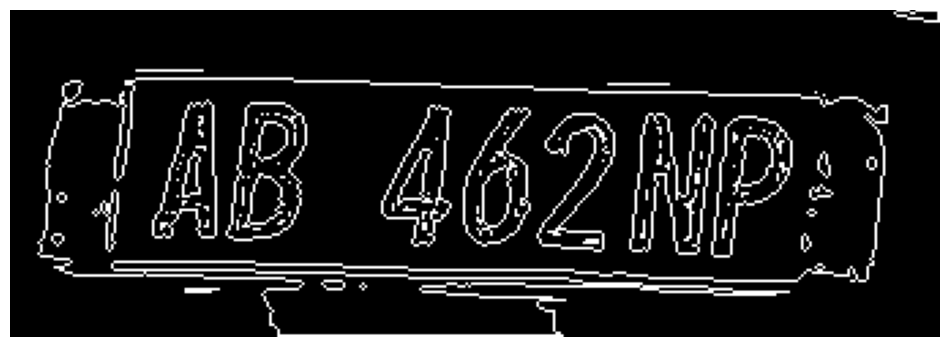

Processed and saved page_25.png


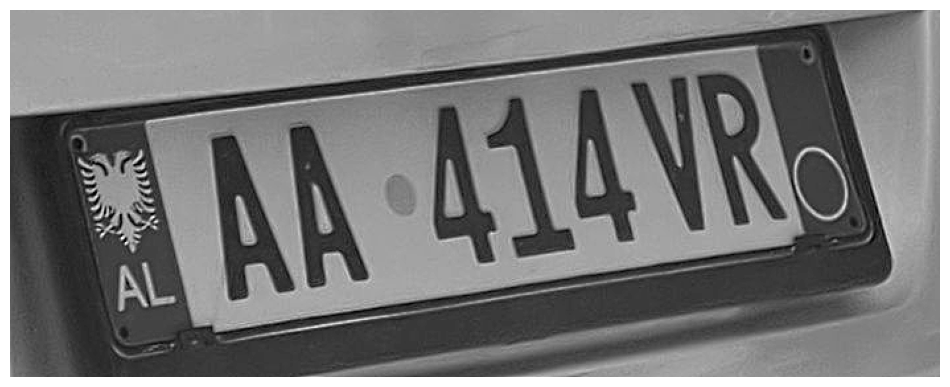

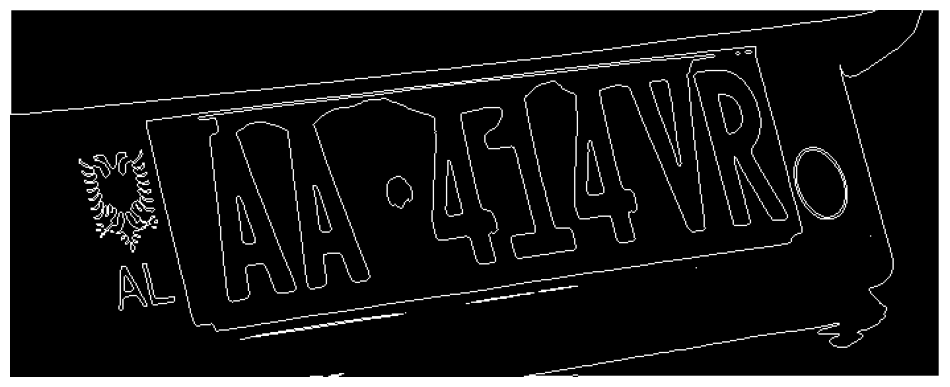

Processed and saved page_31.png


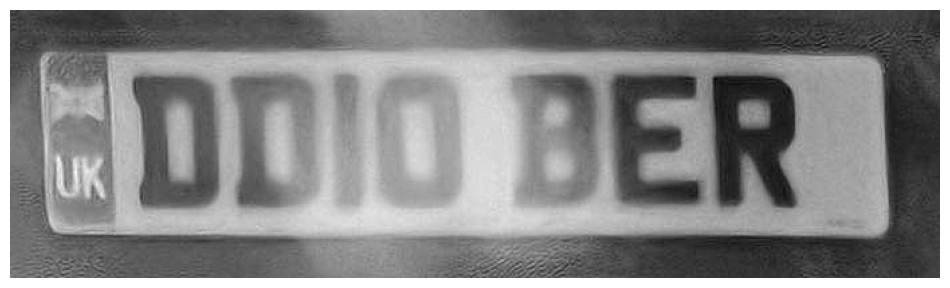

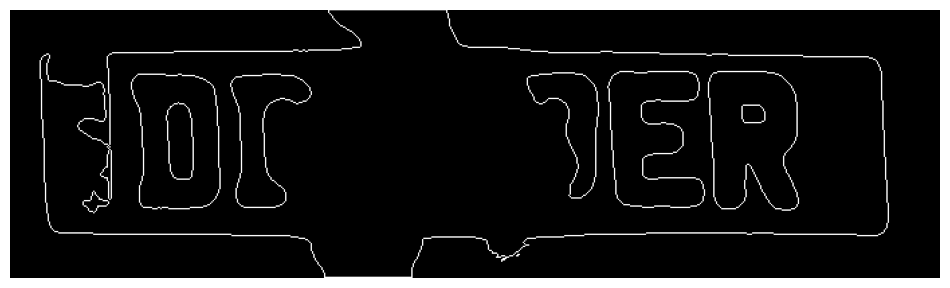

Processed and saved page_4.png


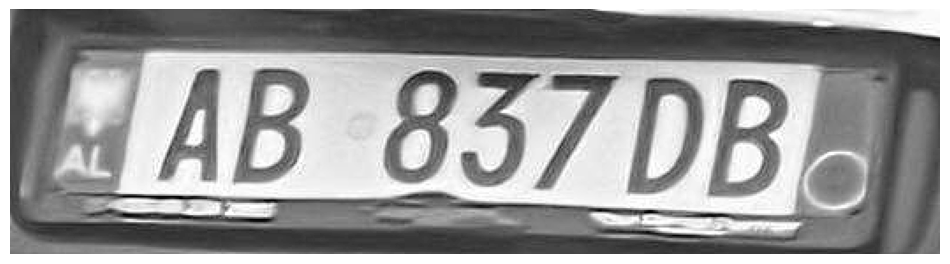

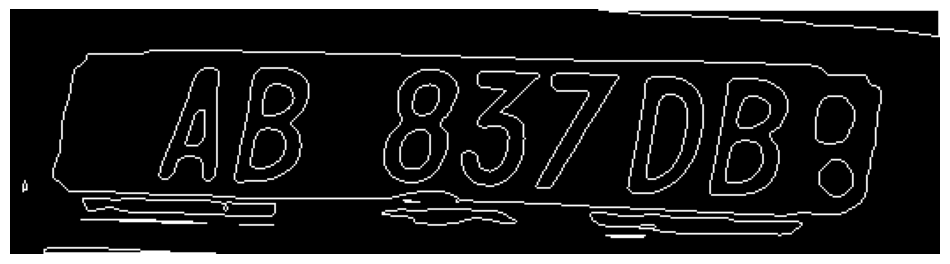

Processed and saved page_2.png


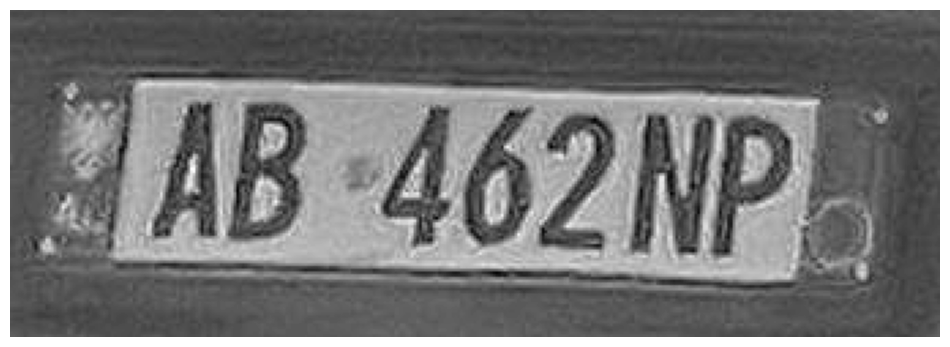

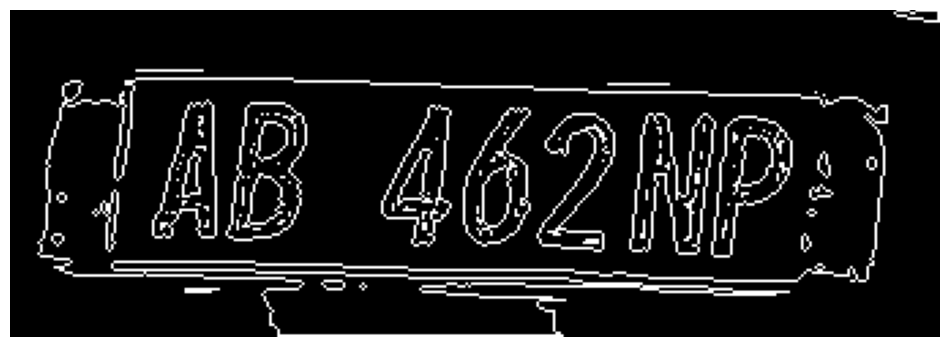

Processed and saved page_23.png


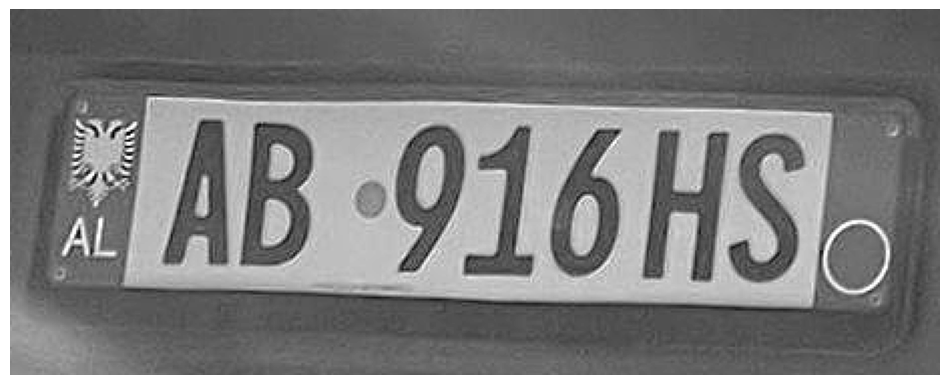

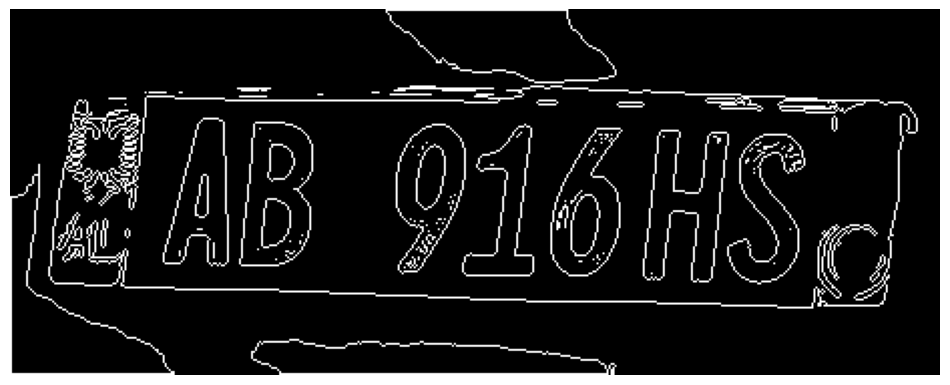

Processed and saved page_24.png


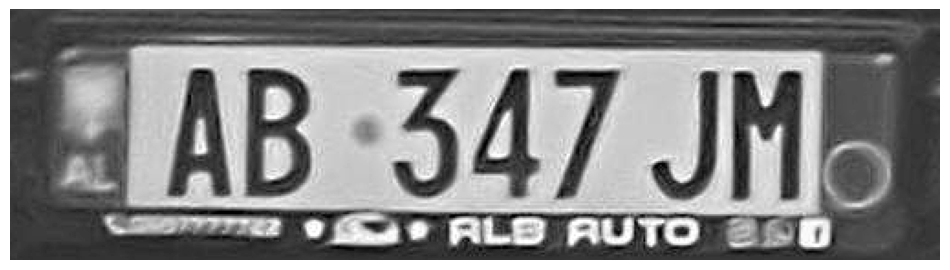

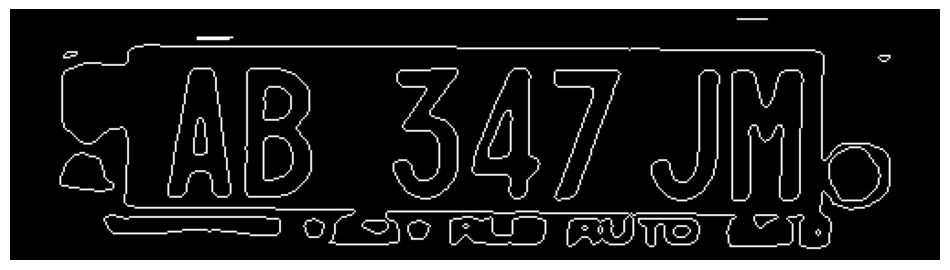

Processed and saved page_32.png


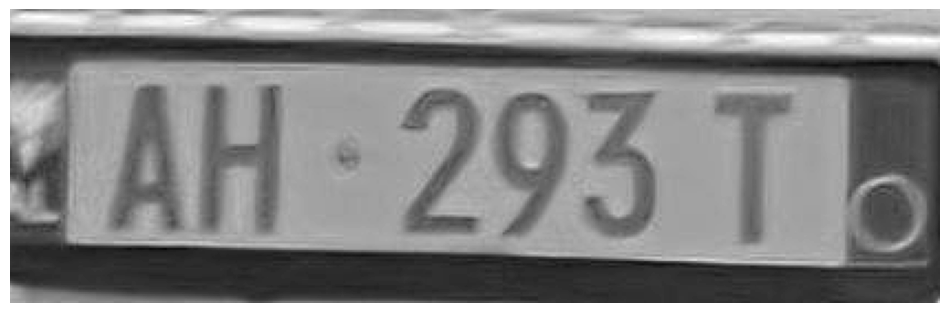

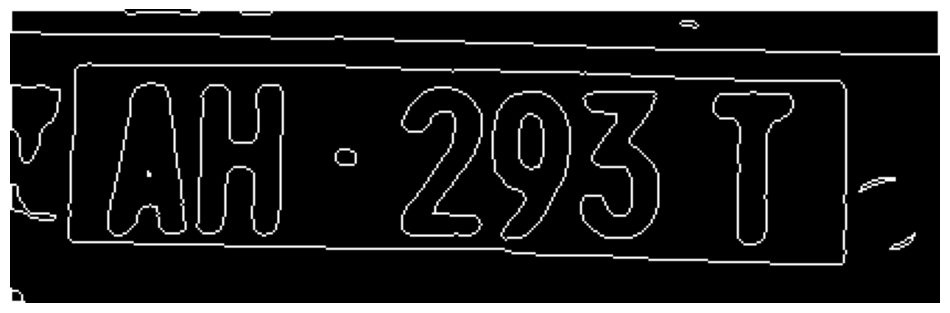

Processed and saved page_12.png


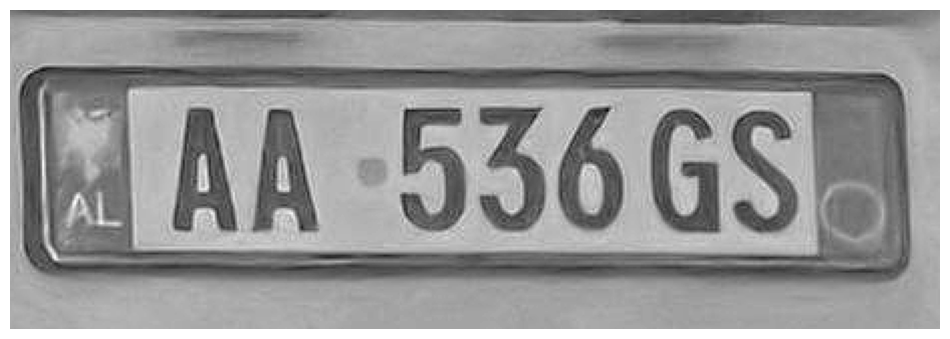

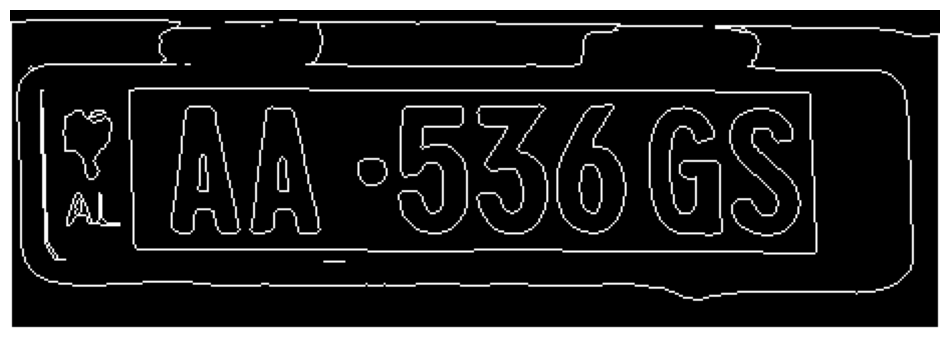

Processed and saved page_22.png


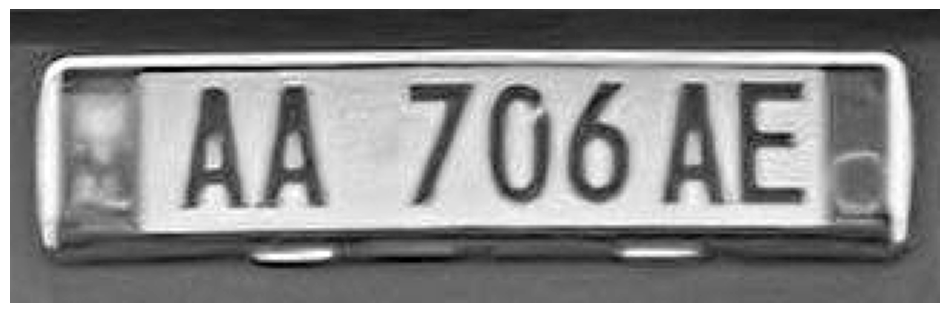

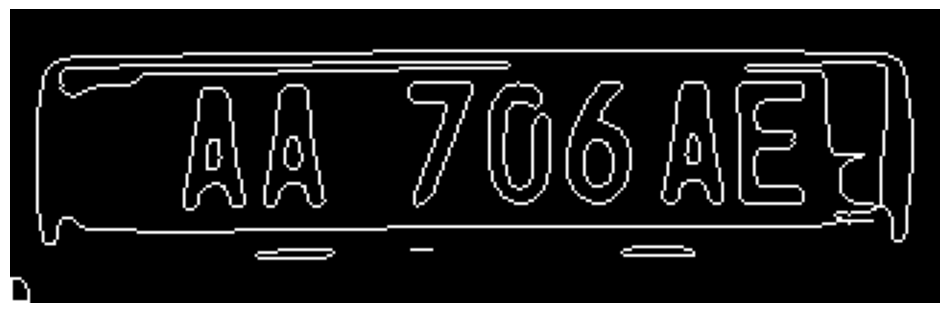

Processed and saved page_16.png


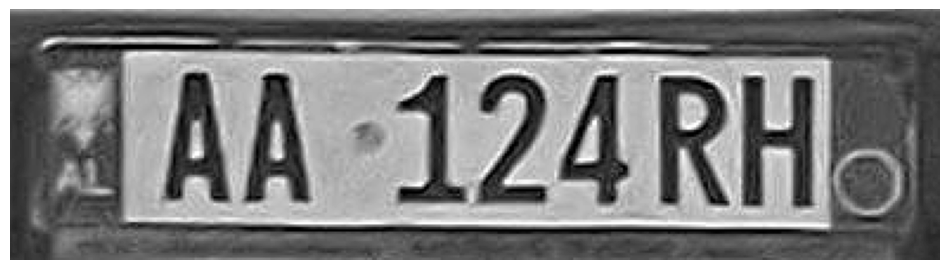

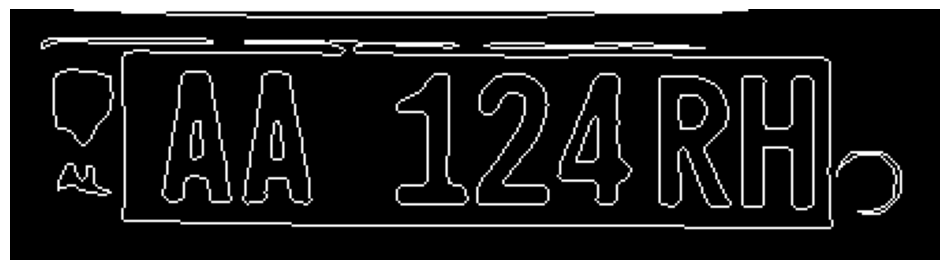

Processed and saved page_9.png


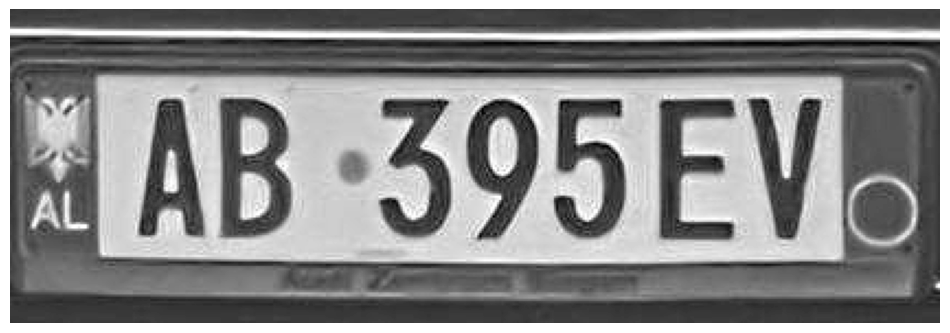

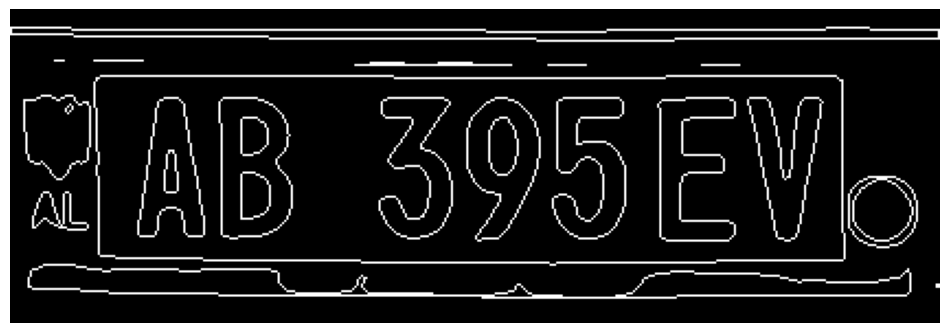

Processed and saved page_11.png


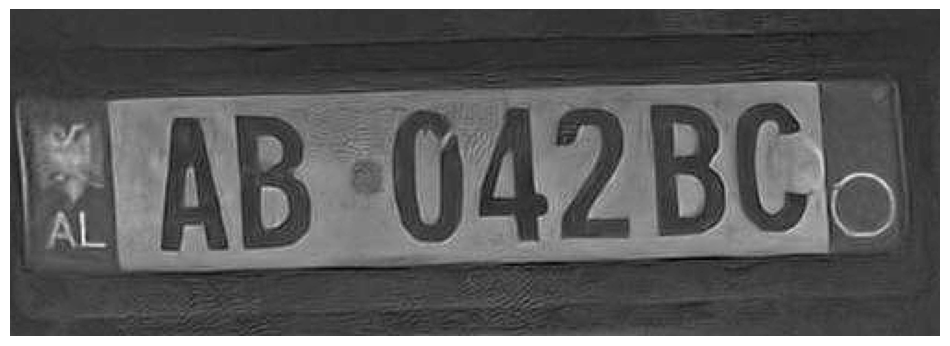

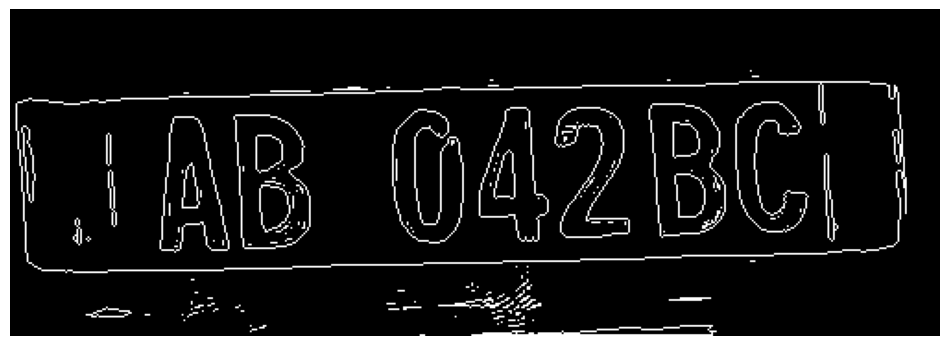

Processed and saved page_28.png


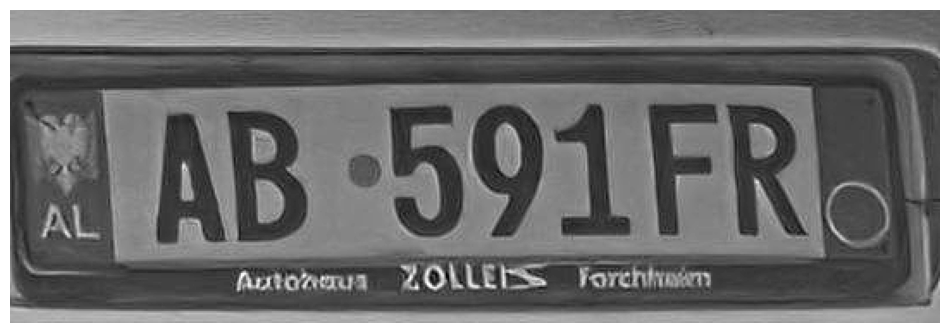

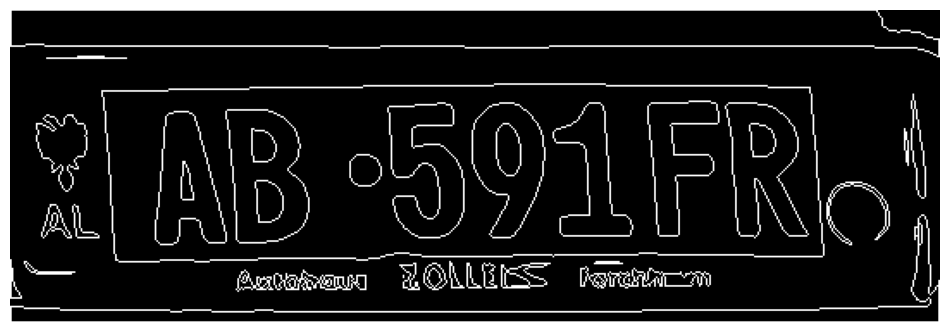

Processed and saved page_8.png


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pytesseract
from PIL import Image

def preprocess_license_plate(image):
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    img_blurred = cv2.GaussianBlur(gray_image, ksize=(5, 5), sigmaX=0)

    # Apply adaptive threshold
    img_thresh = cv2.adaptiveThreshold(
        img_blurred,
        maxValue=255.0,
        adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        thresholdType=cv2.THRESH_BINARY_INV,
        blockSize=19,
        C=9
    )

    # Structuring element
    structuring_element = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

    # Morphological operations
    img_top_hat = cv2.morphologyEx(gray_image, cv2.MORPH_TOPHAT, structuring_element)
    img_black_hat = cv2.morphologyEx(gray_image, cv2.MORPH_BLACKHAT, structuring_element)

    img_grayscale_plus_top_hat = cv2.add(gray_image, img_top_hat)
    gray_image = cv2.subtract(img_grayscale_plus_top_hat, img_black_hat)

    # Enhance contrast
    enhanced_image = cv2.equalizeHist(gray_image)

    # Reduce noise
    denoised_image = cv2.fastNlMeansDenoising(enhanced_image, None, 30, 7, 21)

    # Binarize the image
    _, binary_image = cv2.threshold(denoised_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(binary_image, mode=cv2.RETR_LIST, method=cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours on a black background
    height, width = binary_image.shape
    temp_result = np.zeros((height, width), dtype=np.uint8)
    cv2.drawContours(temp_result, contours=contours, contourIdx=-1, color=(255, 255, 255))

    # Save intermediate steps for visualization
    plt.figure(figsize=(12, 10))
    plt.imshow(gray_image, cmap='gray')
    plt.axis('off')
    plt.savefig('Car-Contrast.png', bbox_inches='tight')
    plt.show()

    plt.figure(figsize=(12, 10))
    plt.imshow(temp_result, cmap='gray')
    plt.axis('off')
    plt.savefig('Car-Contours.png', bbox_inches='tight')
    plt.show()

    return binary_image

def preprocess_images_in_folder(input_folder, output_folder):
    # Ensure output folder exists
    os.makedirs(output_folder, exist_ok=True)

    # Process each image in the input folder
    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            input_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, filename)

            # Read the image
            image = cv2.imread(input_path)
            if image is not None:
                # Preprocess the image
                preprocessed_image = preprocess_license_plate(image)
                # Save the preprocessed image
                cv2.imwrite(output_path, preprocessed_image)
                print(f"Processed and saved {filename}")
            else:
                print(f"Could not read image file {filename}")

# Example usage:
input_folder = '/kaggle/working/yolov5/cropped_images'
output_folder = '/kaggle/working/yolov5/preprocessed_images'
preprocess_images_in_folder(input_folder, output_folder)


# apply ocr to preprocessed, compare them with the ground truth labels

In [ ]:
!cp -r /kaggle/input/labeledtrain /kaggle/working/yolov5/labeled_filenames

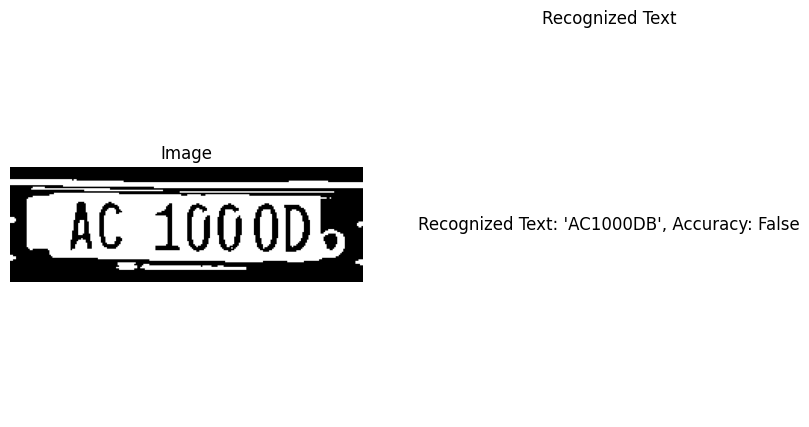

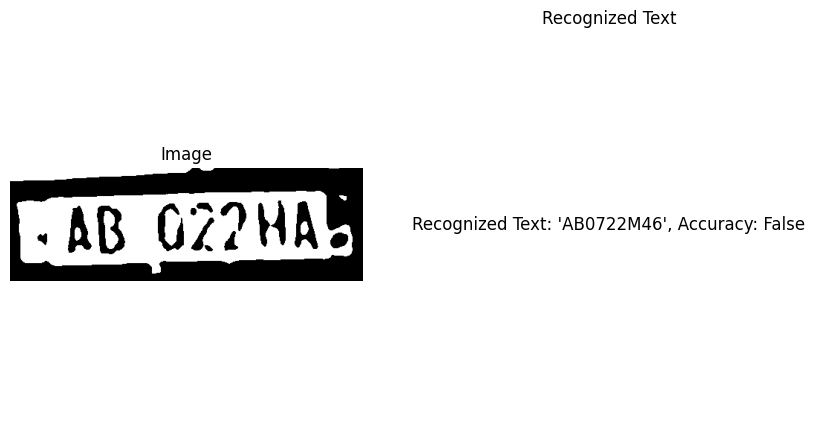

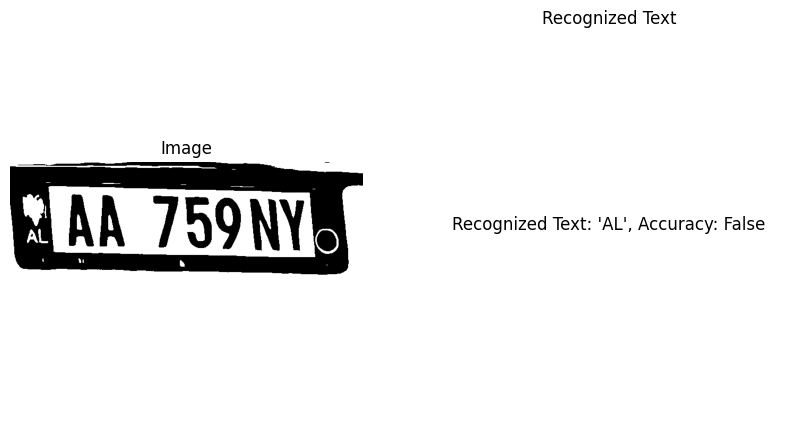

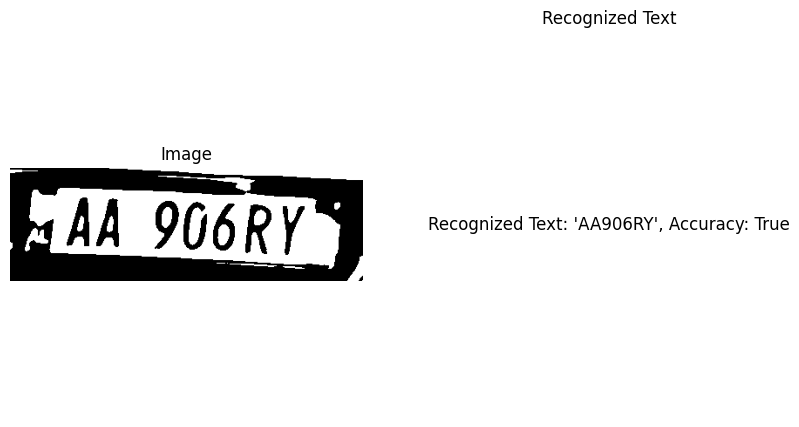

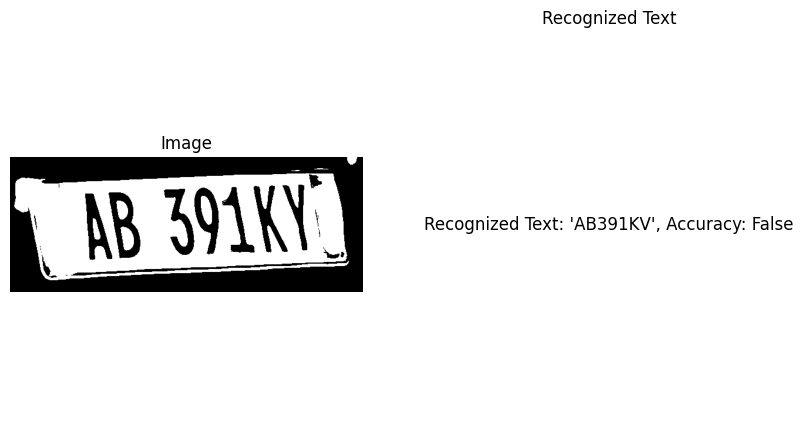

...

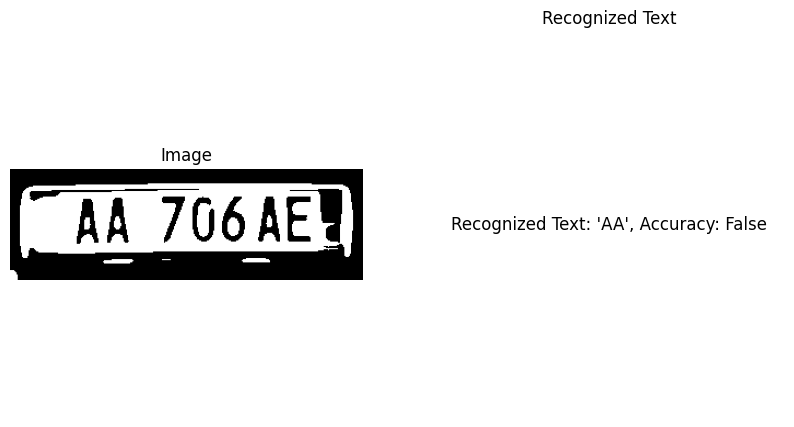

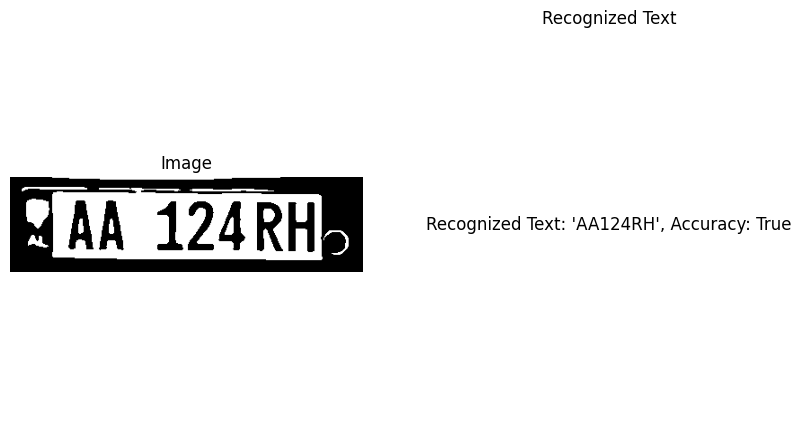

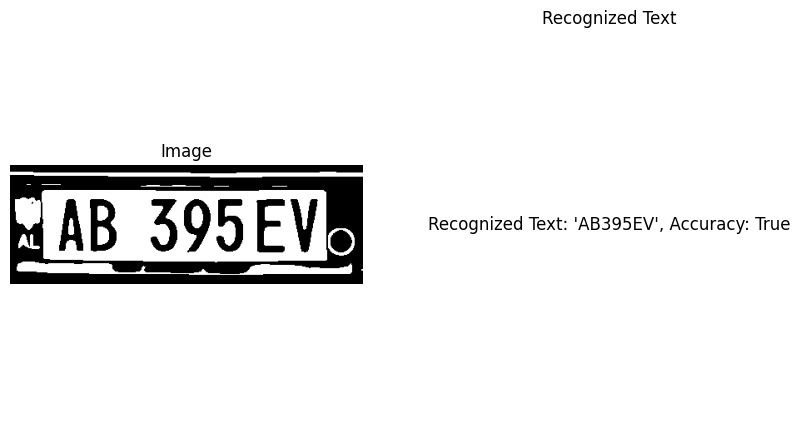

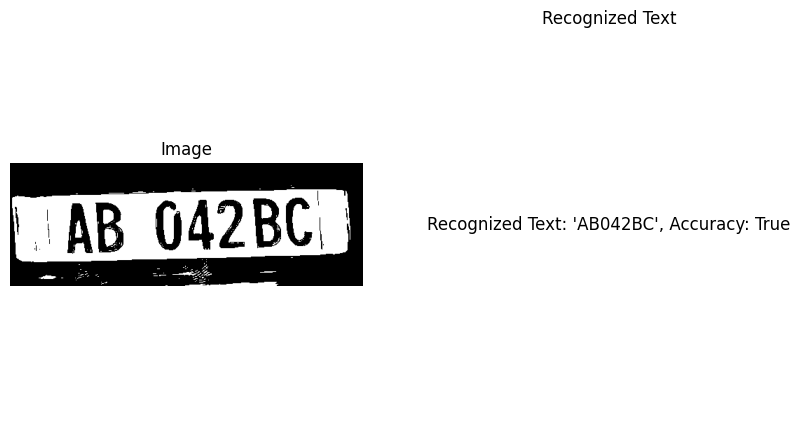

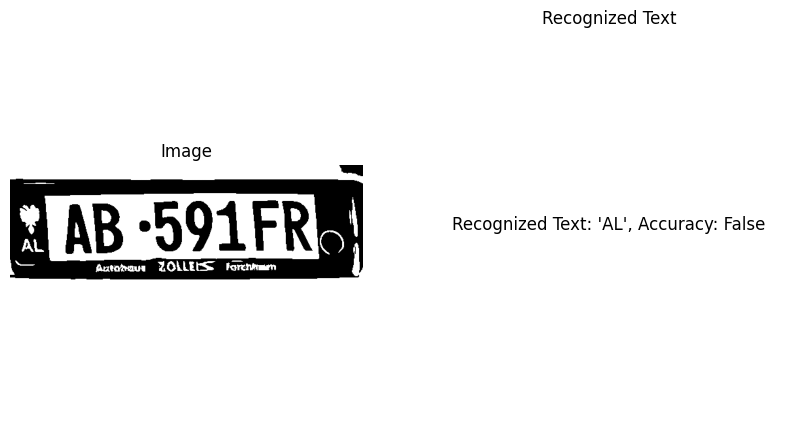

Total preprocessed images: 22
Accurate results: 8
Accuracy: 36.36%


In [ ]:
import os
import cv2
import easyocr
import re
import matplotlib.pyplot as plt


def get_filenames(directory):
    """
    Get all filenames in the given directory.
    """
    return [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

def recognize_text_from_image(image_path):
    """
    Use EasyOCR to recognize text from a given image and format it.
    """
    reader = easyocr.Reader(['en'])  # Initialize EasyOCR with English language
    result = reader.readtext(image_path)
    if result:
        recognized_text = result[0][-2]  # Assuming single text block, return the recognized text
        formatted_text = re.sub(r'[^A-Z0-9]', '', recognized_text.upper())  # Remove spaces and non-alphanumeric characters, convert to uppercase
        return formatted_text
    return ""

def compare_text_with_filenames(recognized_text, filenames):
    """
    Compare the recognized text with filenames.
    """
    for filename in filenames:
        file_text, _ = os.path.splitext(filename)
        formatted_file_text = re.sub(r'[^A-Z0-9]', '', file_text.upper())  # Format the filename similarly
#         print(formatted_file_text)
        if recognized_text == formatted_file_text:
            return True
    return False


def main(image_directory, filenames_directory):
    """
    Main function to process images, compare recognized text with filenames, and calculate accuracy.
    """
    filenames = get_filenames(filenames_directory)
    total_preprocessed_images = 0
    accurate_results = 0

    for image_name in os.listdir(image_directory):
        image_path = os.path.join(image_directory, image_name)
        recognized_text = recognize_text_from_image(image_path)
        if recognized_text:
            total_preprocessed_images += 1
            is_accurate = compare_text_with_filenames(recognized_text, filenames)
            if is_accurate:
                accurate_results += 1
            # Load and display the image
            image = cv2.imread(image_path)
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title('Image')
            plt.axis('off')

            # Display the recognized text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, f"Recognized Text: '{recognized_text}', Accuracy: {is_accurate}", ha='center', va='center', fontsize=12)
            plt.title('Recognized Text')
            plt.axis('off')

            plt.show()

    # Calculate accuracy
    if total_preprocessed_images > 0:
        accuracy = (accurate_results / total_preprocessed_images) * 100
        print(f"Total preprocessed images: {total_preprocessed_images}")
        print(f"Accurate results: {accurate_results}")
        print(f"Accuracy: {accuracy:.2f}%")
    else:
        print("No preprocessed images found.")

if __name__ == "__main__":
    image_directory = '/kaggle/working/yolov5/preprocessed_images'  # Path to your preprocessed images
    filenames_directory = '/kaggle/working/yolov5/labeled_filenames'  # Path to the directory holding the filenames
    main(image_directory, filenames_directory)


we can see the results are not satisfactory. In this case, we need to apply segmentation.

# Results